<a href="https://colab.research.google.com/github/RaviKumar7870/Sentiment-Analysis/blob/master/SentimentAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# In this project we are supposed to predict the sentiment of a given text, And predict if the text is positive, negative or neutral in nature.

### Importing necessary libraries.

In [441]:
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('vader_lexicon')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [442]:
import re
import nltk
import string
import nlp_utils
import collections
import contractions
import nlp_utils as nu
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS
from nltk.tokenize import word_tokenize,sent_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import PorterStemmer, LancasterStemmer, SnowballStemmer

In [443]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
print("Hellto")

Hellto


In [444]:
# Loading data. 
with open('TextAnalytics.txt','r') as f:
    text = f.read()

In [445]:
text
### The data is in the form of a text.

'0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you\'ll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the main appeal of the show is due to th

# Text Normalization

### Text normalization is the process of transforming a text into a canonical (standard) form. For example, the word “gooood” and “gud” can be transformed to “good”, its canonical form. Another example is mapping of near identical words such as “stopwords”, “stop-words” and “stop words” to just “stopwords”

In [446]:
# splitting at ( \n ).
text=text.split('\n')
# Separating at new line using '\n'  

In [447]:
# splitting at ( \t ).
corpus = [text]
for sent in text:
    corpus.append(sent.split('\t'))
# Splitting String by tab(\t)    

In [448]:
letters_only = re.sub(r'[^a-zA-Z]',  
                          " ",          
                          str(corpus))
# Taking only letters

### Tokenization
What is Tokenization?
Tokenization is the process by which big quantity of text is divided into smaller parts called tokens.

Natural language processing is used for building applications such as Text classification, intelligent chatbot, sentimental analysis, language translation, etc. It becomes vital to understand the pattern in the text to achieve the above-stated purpose. These tokens are very useful for finding such patterns as well as is considered as a base step for stemming and lemmatization.

Sentence tokenization is the process of splitting text into individual sentences. ... It does this by looking for the types of textual constructs that confuse the tokenizer and replacing them with single words.

In [449]:
# converting to lowercase.
letters_only=letters_only.lower()

token=nltk.sent_tokenize(letters_only)
token

['      one of the other reviewers has mentioned that after watching just   oz episode you  ll be hooked  they are right  as this is exactly what happened with me  br    br   the first thing that struck me about oz was its brutality and unflinching scenes of violence  which set in right from the word go  trust me  this is not a show for the faint hearted or timid  this show pulls no punches with regards to drugs  sex or violence  its is hardcore  in the classic use of the word  br    br   it is called oz as that is the nickname given to the oswald maximum security state penitentary  it focuses mainly on emerald city  an experimental section of the prison where all the cells have glass fronts and face inwards  so privacy is not high on the agenda  em city is home to many  aryans  muslims  gangstas  latinos  christians  italians  irish and more    so scuffles  death stares  dodgy dealings and shady agreements are never far away  br    br   i would say the main appeal of the show is due t

### Alphanumeric characters

In [450]:
def num_dec_al(word):
    if word.isnumeric():
        return 'xxxxxx'
    elif word.isdecimal():
        return 'xxx...'
    elif word.isalpha():
        return word
    else:
        return 'xxxaaa'

def clean_nda(token):
    tokens = nlp_utils.w_tokenization(token)
    map_list = list(map(num_dec_al,tokens))
    return " ".join(map_list)

corpus_nda = list(map(clean_nda,token))

corpus_nda
### Alpha numeric characters and decimals have been replaced with characters

['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t d

### Removing Contractions.
It is a process where words like isn't, didn't are expanded to is not did not. 
isn't --> is not, 
I'm --> I am, 
they're --> they are,
shouldn't --> should not,
can't --> can not

In [451]:
conm = contractions.CONTRACTION_MAP
def contraction_remove(corpus_nda):
    for key,value in conm.items():
        corpus_nda = re.sub(r"{}".format(key),'{}'.format(value),corpus_nda)
        
    return corpus_nda

special = string.punctuation
def w_tokenization(corpus_nda):
    # convert into lower case
    corpus_nda = corpus_nda.lower()
    # contraction
    corpus_nda = contraction_remove(corpus_nda)
    # 
    tokens = nltk.word_tokenize(corpus_nda) # word tokens
## contractions have been expanded and the letters have been converted to lowercase.    

In [452]:
corpus_nda
## corpus_nda with expanded contractions and converted to lowercase.    

['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t d

In [453]:
data = [corpus_nda]
for sent in text:
    data.append(sent.split('\t'))
# Separating at tab     

In [454]:
data.append(sent.split('\n'))
# Separating at newline

In [455]:
data
# Cleaned text

[['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t 

In [456]:
df = pd.DataFrame(data)
## Saving the data into a dataframe.

In [457]:
df

,0,1,2,3,4,5,6
0,one of the other reviewers has mentioned that ...,None,None,None,None,None,None
1,"0,""One of the other reviewers has mentioned th...",None,None,None,None,None,None
2,"1,""A wonderful little production. <br /><br />...",None,None,None,None,None,None
3,"2,""I thought this was a wonderful way to spend...",None,None,None,None,None,None
4,"3,""Basically there's a family where a little b...",None,None,None,None,None,None
...,...,...,...,...,...,...,...
997,"996,""I hated it. I hate self-aware pretentious...",None,None,None,None,None,None
998,"997,""I usually try to be professional and cons...",None,None,None,None,None,None
999,"998,""If you like me is going to see this in a ...",None,None,None,None,None,None
1000,"999,""This is like a zoology textbook, given th...",None,None,None,None,None,None


In [458]:
df.drop([1,2,3,4,5,6],axis=1,inplace=True)
# dropping unnecessary columns.

In [459]:
df
# Resulting dataframe.

,0
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


In [460]:
df= df.rename(columns={0: 'Text'})
# Renaming the column 0 as 'Text'

#### Final Dataset.

In [461]:
df

,Text
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


### Rows 0,1 and 1000 and 1001 have repeated hence needs to be cleaned.

In [462]:
df.drop(df.index[:1], inplace=True)
# row 1 has repeated so it is dropped.

In [463]:
df.drop(df.index[1000:], inplace=True)
# row 1000 has repeated aswell, so it is dropped.

In [464]:
df

,Text
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
5,"4,""Petter Mattei's """"Love in the Time of Money..."
...,...
996,"995,""Nothing is sacred. Just ask Ernie Fosseli..."
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."


### Removing additional characters present in the dataframe.

In [465]:
## We can further see that there are still some special characters in the dataframe which have to be treated.
df.replace('\d+', '', regex=True, inplace=True)
df.replace(',', '', regex=True, inplace=True)
df.replace('br', '', regex=True, inplace=True)
df.replace('"', '', regex=True, inplace=True)
df.replace("'", '', regex=True, inplace=True)
df.replace('?', '', inplace=True)
df.replace("-", '', regex=True, inplace=True)
df.replace("*", '', inplace=True)
df.replace("***", '', inplace=True)
df.replace("< />", '', regex=True, inplace=True)

In [466]:
df['Text'] = df['Text'].str.strip('[')
df['Text'] = df['Text'].str.strip(']')
df['Text'] = df['Text'].str.strip(')')
df['Text'] = df['Text'].str.strip('(')
## Using the strip function in order to delete the special characters.

In [467]:
df

,Text
1,One of the other reviewers has mentioned that ...
2,A wonderful little production. The filming tec...
3,I thought this was a wonderful way to spend ti...
4,Basically theres a family where a little boy (...
5,Petter Matteis Love in the Time of Money is a ...
...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...
997,I hated it. I hate selfaware pretentious inani...
998,I usually try to be professional and construct...
999,If you like me is going to see this in a film ...


## Lemmatization of the text column

Lemmatization usually refers to doing things properly with the use of a vocabulary and morphological analysis of words, normally aiming to remove inflectional endings only and to return the base or dictionary form of a word, which is known as the lemma.
Lemmatization will generate the root form of the inflected words

In [468]:
df['Text'] = df['Text'].apply(nu.lemmatization_sentence)

In [469]:
Text=df['Text']

In [470]:
token=Text.to_numpy()
## to_numpy() function is used to convert the given series or dataframe object to Numpy-array representation.

In [471]:
token=nltk.sent_tokenize(str(token))
## Sentence tokenization

In [472]:
data = np.array(token)
## Saving token in form of array

In [473]:
stop = stopwords.words('english')
## Saving stopwords in stop

### Removing stopwords from the dataframe

In [474]:
text = data
text_tokens = word_tokenize(str(text))

tokens_without_sw = [word for word in text_tokens if not word in stop]

print(tokens_without_sw)   
## Removing stopwords from the text and printing the words without stopwords

['[', '``', '[', "'one", 'reviewer', 'mention', 'watch', 'oz', 'episode', 'youll', 'hook', 'right', 'exactly', 'happen', 'me.the', 'first', 'thing', 'strike', 'oz', 'utality', 'unflinching', 'scene', 'violence', 'set', 'right', 'word', 'go', 'trust', 'show', 'faint', 'hearted', 'timid', 'show', 'pull', 'punch', 'regard', 'drug', 'sex', 'violence', 'hardcore', 'classic', 'use', 'word.it', 'call', 'oz', 'nickname', 'give', 'oswald', 'maximum', 'security', 'state', 'penitentary', 'focus', 'mainly', 'emerald', 'city', 'experimental', 'section', 'prison', 'cell', 'glass', 'front', 'face', 'inwards', 'privacy', 'high', 'agenda', 'em', 'city', 'home', 'many..aryans', 'muslim', 'gangstas', 'latinos', 'christian', 'italian', 'irish', '...', '.so', 'scuffle', 'death', 'stare', 'dodgy', 'dealing', 'shady', 'agreement', 'never', 'far', 'away.i', 'would', 'say', 'main', 'appeal', 'show', 'due', 'fact', 'go', 'show', 'wouldnt', 'dare', 'forget', 'pretty', 'picture', 'paint', 'mainstream', 'audience'

# Visualization

In [475]:
stopwords = set(stopwords.words("english"))
## Removing stopwords for wordcloud visualization

In [476]:
wordcloud = WordCloud(stopwords=stop, background_color="white", max_words=1000).generate(str(tokens_without_sw))
## WordCloud is a technique to show which words are the most frequent among the given text

### Visualizing the highest repeating words in the dataframe using  the wordcloud.

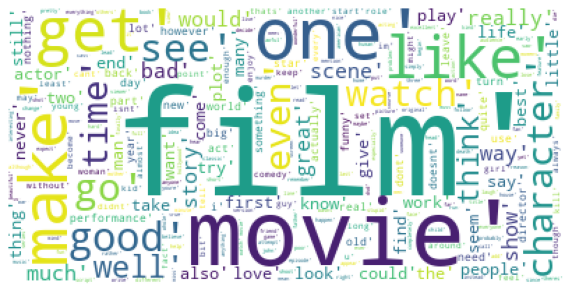

In [477]:
rcParams['figure.figsize'] = 10, 20
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

### Counting the number of times a word has repeated through out the data.

In [478]:
tokens_without_sw=(str(tokens_without_sw))

In [479]:
filtered_words = [word for word in tokens_without_sw.split() if word not in stopwords]
counted_words = collections.Counter(filtered_words)

words = []
counts = []
for letter, count in counted_words.most_common(10):
    words.append(letter)
    counts.append(count)
# Removing stopwords as creating two lists to display the words and their counts    

In [480]:
counted_words.most_common(100) # the word 'movie' has repeated for 2081 times.

[("'movie',", 2018),
 ("'film',", 1772),
 ("'one',", 980),
 ("'make',", 887),
 ("'see',", 856),
 ("'like',", 828),
 ("'get',", 750),
 ("'good',", 643),
 ("'go',", 542),
 ("'watch',", 541),
 ("'time',", 533),
 ("'character',", 524),
 ("'even',", 509),
 ("'would',", 490),
 ("'bad',", 488),
 ("'think',", 470),
 ("'story',", 467),
 ("'...',", 457),
 ("'really',", 450),
 ("'well',", 445),
 ("'scene',", 434),
 ("'much',", 392),
 ("'show',", 375),
 ("'great',", 374),
 ("'know',", 369),
 ("'take',", 361),
 ("'look',", 360),
 ("'people',", 356),
 ("'way',", 353),
 ("'give',", 349),
 ("'also',", 336),
 ("'say',", 335),
 ("'come',", 333),
 ("'play',", 332),
 ("'first',", 325),
 ("'end',", 321),
 ("'find',", 309),
 ("'dont',", 309),
 ("'thing',", 299),
 ("'plot',", 297),
 ("'want',", 293),
 ("'many',", 282),
 ("'love',", 281),
 ("'work',", 275),
 ("'life',", 273),
 ("'never',", 272),
 ("'little',", 270),
 ("'seem',", 269),
 ("'could',", 269),
 ("'two',", 265),
 ("'actor',", 263),
 ("'best',", 258)

# Visualizing top 10 repeated/common words using bar graph.

<BarContainer object of 10 artists>

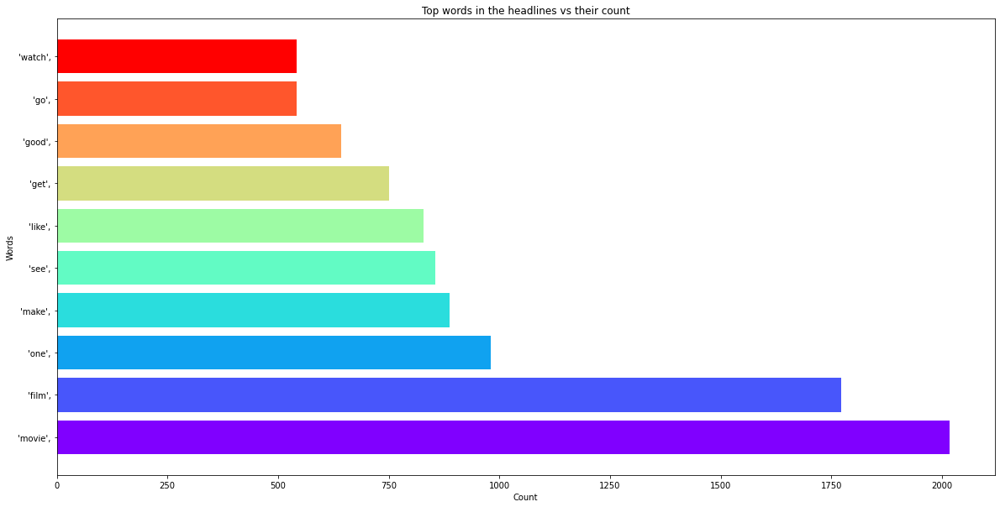

In [481]:
colors = cm.rainbow(np.linspace(0, 1, 10))
rcParams['figure.figsize'] = 20, 10

plt.title('Top words in the headlines vs their count')
plt.xlabel('Count')
plt.ylabel('Words')
plt.barh(words, counts, color=colors)

# Sentiment Analysis.

### Vader sentiment analysis is done in order to find if a given (Word) is positive, negative or  neutral in nature.
VADER belongs to a type of sentiment analysis that is based on lexicons of sentiment-related words. In this approach, each of the words in the lexicon is rated as to whether it is positive or negative, and in many cases, how positive or negative. Below you can see an excerpt from VADER’s lexicon, where more positive words have higher positive ratings and more negative words have lower negative ratings.
Vader sentiment analysis for a given (word) if positive, negative or  neutral in nature.

In [482]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sentence = tokens_without_sw
tokenized_sentence = nltk.word_tokenize(sentence)

sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

for word in tokenized_sentence:
    if (sid.polarity_scores(word)['compound']) >= 0.1:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.1:
        neg_word_list.append(word)
    else:        
        neu_word_list.append(word)                

#print('Positive:',pos_word_list)        
#print('Neutral:',neu_word_list)    
#print('Negative:',neg_word_list) 
#score = sid.polarity_scores(sentence)
#print('\nScores:', score)

In [483]:
#pos_word_list[:100]
#neg_word_list[:100]

### Top 100 Positive words.

In [484]:
print(list(iter(pos_word_list[:100]))) # These are the top 100 positive words found in the dataset.

["'trust", "'security", "'agreement", "'pretty", "'charm", "'romance", "'ready", "'well", "'comfortable", "'wonderful", "'comforting", "'well", "'truly", "'well", "'worth", "'great", "'comedy", "'dream", "'solid", "'play", "'well", "'wonderful", "'lighthearted", "'comedy", "'well", "'laugh", "'comedy", "'impress", "'sexy", "'spirited", "'jewel", "'interesting", "'great", "'comedy", "'thriller", "'like", "'thriller", "'well", "'play", "'love", "'stunning", "'success", "'play", "'sophisticated", "'best", "'sincere", "'good", "'talented", "'wish", "'good", "'luck", "'await", "'favorite", "'noble", "'truly", "'sympathetic", "'delight", "'like", "'fun", "'sure", "'like", "'excitement", "'heros", "'thank", "'like", "'nice", "'amazing", "'fresh", "'innovative", "'funny", "'truly", "'entertaining", "'original", "'fit", "'respect", "'original", "'huge", "'success", "'encourage", "'positive", "'truly", "'play", "'happy", "'credit", "'best", "'like", "'original", "'laughter", "'like", "'love", "'

### Top 100 Negative words.

In [485]:
print(list(iter(neg_word_list[:100]))) # These are the top 100 negative words found in the dataset.

["'strike", "'violence", "'timid", "'violence", "'prison", "'death", "'dodgy", "'forget", "'forget", "'forget", "'mess", "'strike", "'nasty", "'violence", "'violence", "'injustice", "'kill", "'prison", "'bitch", "'lack", "'prison", "'uncomfortable", "'discomforting", "'disappear", "'terribly", "'suspect", "'killer", "'disappoint", "'risk", "'devil", "'fight", "'kill", "'argue", "'ruin", "'meaningless", "'ignore", "'loneliness", "'anxiously", "'bore", "'startle", "'doubt", "'drop", "'waste", "'painfully", "'bad", "'bad", "'hard", "'awful", "'bad", "'mistake", "'bad", "'awful", "'lame", "'nasty", "'bore", "'obsessive", "'hell", "'odd", "'low", "'problem", "'lose", "'scary", "'helplessly", "'horror", "'die", "'scary", "'cry", "'kill", "'warn", "'cry", "'complain", "'evil", "'mad", "'cry", "'disappoint", "'fight", "'cry", "'reek", "'annoying", "'shoot", "'ruin", "'cut", "'prisoner", "'bad", "'sorrow", "'bizarre", "'hard", "'ridiculous", "'nonsense", "'stereotyped", "'bad", "'waste", "'star

## Vader sentiment analysis for a given (Sentence) if positive, negative or  neutral in nature.

In [486]:
sid = SentimentIntensityAnalyzer()
for sentence in Text:
     print(sentence)
        
     ss = sid.polarity_scores(sentence)
     for k in ss:
         print('{0}: {1}, ' .format(k, ss[k]), end='')
     print()

one of the other reviewer have mention that after watch just oz episode youll be hook they be right a this be exactly what happen with me.the first thing that strike me about oz be it utality and unflinching scene of violence which set in right from the word go trust me this be not a show for the faint hearted or timid this show pull no punch with regard to drug sex or violence it be hardcore in the classic use of the word.it be call oz a that be the nickname give to the oswald maximum security state penitentary it focus mainly on emerald city an experimental section of the prison where all the cell have glass front and face inwards so privacy be not high on the agenda em city be home to many..aryans muslim gangstas latinos christian italian irish and more ... .so scuffle death stare dodgy dealing and shady agreement be never far away.i would say the main appeal of the show be due to the fact that it go where other show wouldnt dare forget pretty picture paint for mainstream audience f

### Converting all Polarity scores and sentences into a dataframe.

In [487]:
analyzer = SentimentIntensityAnalyzer()
df['rating'] = Text.apply(analyzer.polarity_scores)
df=pd.concat([df.drop(['rating'], axis=1), df['rating'].apply(pd.Series)], axis=1)
### Creating a dataframe.

In [488]:
df.head()

,Text,neg,neu,pos,compound
1,one of the other reviewer have mention that af...,0.189,0.749,0.062,-0.9937
2,a wonderful little production the filming tech...,0.050,0.758,0.192,0.9739
3,i think this be a wonderful way to spend time ...,0.107,0.657,0.236,0.9748
4,basically theres a family where a little boy j...,0.144,0.782,0.074,-0.9080
5,petter matteis love in the time of money be a ...,0.054,0.792,0.154,0.9744


## Arranging the dataset in descending order based on (Compound score) to find the most important sentence from the given data.

In [489]:
imp_sent=df.sort_values(by='compound', ascending=False)
## arranging the compound column in descending order to find the best sentence. 

In [490]:
imp_sent 

,Text,neg,neu,pos,compound
411,i firmly believe that the best oscar ceremony ...,0.063,0.599,0.339,0.9998
567,few would argue that master animation director...,0.039,0.727,0.234,0.9996
211,i have just give a for thief highway i mention...,0.089,0.620,0.291,0.9994
364,the plot michael linnett connors have do every...,0.021,0.807,0.173,0.9992
944,a film for mature educate audience ... i saw r...,0.072,0.675,0.253,0.9989
...,...,...,...,...,...
354,this film hold my interest enough to watch it ...,0.201,0.683,0.116,-0.9980
825,mexican werewolf in texas be set in the small ...,0.222,0.702,0.076,-0.9984
247,this show make absolutely no sense every week ...,0.372,0.575,0.053,-0.9987
766,this film cant make up it mind whether it mess...,0.263,0.628,0.108,-0.9988


In [491]:
print(df['Text'].iloc[410] ) # sentence with index 410 has the highest compound score 
                             # and hence it is the most important sentence among all the sentences.

i firmly believe that the best oscar ceremony in recent year be in for two reason host steve martin be at his most witty i saw the teamster help michael moore into the trunk of his limo and ill good not mention the gay mafia in case i wake up with a poodle head in my bed surprise winners no one have adrien brody down for best actor genuine applause or roman polanski for best director genuine jeer and boo but they win last year award ceremony wasnt too bad but there be little in the way of surprise and i be happy to see return of the king sweep the award even if it wasnt the best in the trilogy fellowship be much good but what let the bbc coverage down be jonathan ross get a few of his sycophantic mate round and pretend they be hilarious when they be anything but so when i hear sky be do the coverage for british tv i be expect barry norman and mark kermode to be do the link but instead we end up with jamie theakston and sharon osbourne oh gawd if british tv be desperate for film critic 

## Finding top positive sentence in the data.

In [492]:
pos_sent=df.sort_values(by='pos', ascending=False)
## Arranging the dataframe by positive column in descending order to find the best postive sentence.

In [493]:
pos_sent

,Text,neg,neu,pos,compound
161,mystery men have get to be the stupid film ive...,0.104,0.431,0.466,0.9890
10,if you like original gut wrench laughter you w...,0.100,0.524,0.376,0.8910
322,i have watch this movie countless time and nev...,0.000,0.651,0.349,0.9827
979,i suppose for this film be suppose to be cool ...,0.024,0.630,0.346,0.9961
931,i catch this on television one day when i be y...,0.073,0.586,0.340,0.9914
...,...,...,...,...,...
340,i find the critique of many imdb user a little...,0.135,0.857,0.007,-0.9628
836,the story have be tell before a deadly disease...,0.057,0.943,0.000,-0.4497
756,a wellmade runofthemill movie with a tragic en...,0.127,0.873,0.000,-0.7906
997,i hat it i hate selfaware pretentious inanity ...,0.210,0.790,0.000,-0.9371


In [494]:
print(df['Text'].iloc[160] ) # sentence with index 160 has the highest positive score and is the most postive. 

mystery men have get to be the stupid film ive ever see but what a film i think it be fabulous excellent and impressive it be funny welldone and nice to see ridiculous super hero for a change and be able to pull it off this be great ill definitely watch it again


## Finding top negative sentence in the data.

In [495]:
neg_sent=df.sort_values(by='neg', ascending=False)
## Arranging the dataframe by negative column in descending order to find the best negative sentence.

In [496]:
neg_sent

,Text,neg,neu,pos,compound
414,a rating of do not begin to express how dull d...,0.404,0.596,0.000,-0.8316
247,this show make absolutely no sense every week ...,0.372,0.575,0.053,-0.9987
737,baba rajinikanth will never forget this name i...,0.370,0.603,0.027,-0.9960
282,after a very scary crude open which give you t...,0.340,0.603,0.057,-0.9904
98,well i like to watch bad horror bmovies cause ...,0.314,0.549,0.136,-0.9816
...,...,...,...,...,...
288,i saw this movie last night and think it be de...,0.000,0.806,0.194,0.9676
864,a a huge baseball fan my scrutiny of this film...,0.000,0.776,0.224,0.8750
47,protocol be an implausible movie whose only sa...,0.000,0.712,0.288,0.9747
865,this film take you on one family impossible jo...,0.000,0.788,0.212,0.8655


In [497]:
print(df['Text'].iloc[413] )# sentence with index 413 has the highest negative score and is the most negative sentence 

a rating of do not begin to express how dull depressing and relentlessly bad this movie be


In [498]:
sentences=df

## Giving threshold values to classify if a given sentence is positive, negative or neutral in nature.

In [499]:
#Assigning score categories and logic
i = 0

predicted_value = [ ] #empty series to hold our predicted values

while(i<len(sentences)):
    if ((sentences.iloc[i]['compound'] >= 0.5)):
        predicted_value.append('positive')
        i = i+1
    elif ((sentences.iloc[i]['compound'] > 0) & (sentences.iloc[i]['compound'] < 0.5)):
        predicted_value.append('neutral')
        i = i+1
    elif ((sentences.iloc[i]['compound'] <= 0)):
        predicted_value.append('negative')
        i = i+1
## The threshold value will categorize if a given sentence is positive negative or neutral in nature.     



In [500]:
predicted_value

['negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'neutral',
 'neutral',
 'positive',
 'positive',
 'neutral',
 'negative',
 'neutral',
 'negative',
 'negative',
 'negative',
 'negative',
 'neutral',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'neutral',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'neutral',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'neutral',
 'negative',
 'neutral',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'negative',
 'negati

### Adding the target or sentiment column to our data frame.

In [501]:
df['Target'] = predicted_value 
## A new column has been created called as 'Target' with sentiments assigned to a given text.

In [502]:
df.head()

,Text,neg,neu,pos,compound,Target
1,one of the other reviewer have mention that af...,0.189,0.749,0.062,-0.9937,negative
2,a wonderful little production the filming tech...,0.050,0.758,0.192,0.9739,positive
3,i think this be a wonderful way to spend time ...,0.107,0.657,0.236,0.9748,positive
4,basically theres a family where a little boy j...,0.144,0.782,0.074,-0.9080,negative
5,petter matteis love in the time of money be a ...,0.054,0.792,0.154,0.9744,positive


### Removing/dropping the 'neg', 'neu', 'pos', and 'compound' columns.

In [503]:
df.drop(['neg','neu','pos','compound'],axis=1,inplace=True)
## Dropping the neg, neu, pos, and compound columns.

In [504]:
df
## Final dataframe with sentiments.

,Text,Target
1,one of the other reviewer have mention that af...,negative
2,a wonderful little production the filming tech...,positive
3,i think this be a wonderful way to spend time ...,positive
4,basically theres a family where a little boy j...,negative
5,petter matteis love in the time of money be a ...,positive
...,...,...
996,nothing be sacred just ask ernie fosselius the...,negative
997,i hat it i hate selfaware pretentious inanity ...,negative
998,i usually try to be professional and construct...,negative
999,if you like me be go to see this in a film his...,negative


In [505]:
df['Target'].value_counts()
### There are 568 positive, 369 negative and 63 neutral columns present in the dataset.

positive    557
negative    373
neutral      70
Name: Target, dtype: int64

In [506]:
cat_cols=['Target']
le=LabelEncoder()
for i in cat_cols:
    df[i]=le.fit_transform(df[i])
df.dtypes
### Label Encoding the target column.

Text      object
Target     int64
dtype: object

In [507]:
df['Target'].value_counts()
## Label encoded value_counts()

2    557
0    373
1     70
Name: Target, dtype: int64

In [508]:
df

,Text,Target
1,one of the other reviewer have mention that af...,0
2,a wonderful little production the filming tech...,2
3,i think this be a wonderful way to spend time ...,2
4,basically theres a family where a little boy j...,0
5,petter matteis love in the time of money be a ...,2
...,...,...
996,nothing be sacred just ask ernie fosselius the...,0
997,i hat it i hate selfaware pretentious inanity ...,0
998,i usually try to be professional and construct...,0
999,if you like me be go to see this in a film his...,0


In [525]:
# Vectorizing training data. 

tfidf = TfidfVectorizer() 
X = tfidf.fit_transform(df['Text'])
x = [" I am Happy"]
xx = tfidf.fit_transform(x)

## Applying Tf-Idf vectorizer on the Text column.

  (0, 1)	0.7071067811865475
  (0, 0)	0.7071067811865475


In [510]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=40)
print(X_train.shape,X_test.shape,Y_train.shape,Y_test.shape)

### Splitting the dataset.

(800, 16158) (200, 16158) (800,) (200,)


### Logistic Regression

In [528]:
log_reg = LogisticRegression().fit(X_train, Y_train)

#predict on train 
train_preds = log_reg.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds))

#predict on test
test_preds = log_reg.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds))


Model accuracy on train is:  0.90875
Model accuracy on test is:  0.625


In [512]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.metrics import accuracy_score, auc, confusion_matrix, roc_auc_score, roc_curve, recall_score

## Decision Tree Classifier

In [513]:
DT = DecisionTreeClassifier().fit(X,Y)

In [514]:
#predict on train 
train_preds2 = DT.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds2))

#predict on test
test_preds2 = DT.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds2))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds2))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds2))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds2).sum(),'/',((Y_test == test_preds2).sum()+(Y_test != test_preds2).sum()))
print('-'*50)

# Kappa Score
print('KappaScore is: ', metrics.cohen_kappa_score(Y_test,test_preds2))

Model accuracy on train is:  1.0
Model accuracy on test is:  1.0
--------------------------------------------------
confusion_matrix train is:  [[289   0   0]
 [  0  61   0]
 [  0   0 450]]
confusion_matrix test is:  [[ 84   0   0]
 [  0   9   0]
 [  0   0 107]]
Wrong predictions out of total
--------------------------------------------------
0 / 200
--------------------------------------------------
KappaScore is:  1.0


In [515]:
#fit the model on train data 
RF=RandomForestClassifier().fit(X_train,Y_train)
#predict on train 
train_preds3 = RF.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds3))

#predict on test
test_preds3 = RF.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds3))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds3))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds3))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds3).sum(),'/',((Y_test == test_preds3).sum()+(Y_test != test_preds3).sum()))
print('-'*50)

Model accuracy on train is:  1.0
Model accuracy on test is:  0.6
--------------------------------------------------
confusion_matrix train is:  [[289   0   0]
 [  0  61   0]
 [  0   0 450]]
confusion_matrix test is:  [[ 17   0  67]
 [  0   0   9]
 [  4   0 103]]
Wrong predictions out of total
--------------------------------------------------
80 / 200
--------------------------------------------------


In [516]:
#fit the model on train data 
KNN = KNeighborsClassifier().fit(X_train,Y_train)
#predict on train 

train_preds4 = KNN.predict(X_train)
#accuracy on train
print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds4))

#predict on test
test_preds4 = KNN.predict(X_test)
#accuracy on test
print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds4))
print('-'*50)

#Confusion matrix
print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds4))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds4))
print('Wrong predictions out of total')
print('-'*50)

# Wrong Predictions made.
print((Y_test !=test_preds4).sum(),'/',((Y_test == test_preds4).sum()+(Y_test != test_preds4).sum()))
print('-'*50)


Model accuracy on train is:  0.71125
Model accuracy on test is:  0.57
--------------------------------------------------
confusion_matrix train is:  [[128   2 159]
 [ 21   8  32]
 [ 16   1 433]]
confusion_matrix test is:  [[17  0 67]
 [ 1  0  8]
 [10  0 97]]
Wrong predictions out of total
--------------------------------------------------
86 / 200
--------------------------------------------------
